In [1]:
#Visuallize predicted structure, cofactor, docked poses, and calculation of stereochemistry
#Pngs generated stored in png dir
import os
import sys
import pandas as pd
import numpy as np
import math
import nglview

In [2]:
#Arguments
protein = 'tropb'
ligand = '2'
af2_model_path = f'../../model/models/{protein}/ranked_0.pdb'
pdb_with_fad_path = f'../../cofactor/pdb_with_fad/{protein}_fad.pdb'
dockdir = f'../../dock/poses/{protein}_{ligand}_prot'
cluster_df = pd.read_excel(f'../../dock/cluster/{protein}_{ligand}_prot.xlsx', header = 0, index_col = 0)

In [3]:
#Get lowest energy pose
min_index = cluster_df['min_index'].iloc[0]
top_pose_path = f'../../dock/poses/{protein}_{ligand}_prot/{protein}_{ligand}_{min_index}.pdb'

In [4]:
#List of atoms defining ring of ligand
lig_atom_dict = {
    '2': ['C9','C7','C6', 'C13', 'C12', 'C10', 'O4'],
    '3': ['C9','C7','C6', 'C13', 'C12', 'C10', 'O5'],
    '4':  ['C1', 'C5', 'C6', 'C4', 'C3', 'C2', 'O3'],
    '5': ['C2', 'C4', 'C6', 'C10', 'C3', 'C1', 'O2'], 
}

In [5]:
#Functions for manipulating PDB with pandas dataframes (same as stereo.ipynb)
#Read in pdb as a dataframe
def pdb_as_df(pdb_file):
    pdb_dict = dict()
    metrics = [
        "atom_num",
        "atom_name",
        "resi_name",
        "chain",
        "resi_num",
        "atom_x",
        "atom_y",
        "atom_z",
        "atom_occ",
        "atom_b",
        "atom_segid"
    ]
    columns = [
        (6,11),
        (12,16),
        (17,21),
        (21,22),
        (22,26),
        (30,38),
        (38,46),
        (46,54),
        (54,60),
        (60,66),
        (72,76)
    ]
    pdb_txt = open(pdb_file, 'r').read().splitlines()
    index_i = 0
    for line in pdb_txt:
        if line.startswith('ATOM') or line.startswith('HETATM'):
            atom_dict = {metric: line[col[0]:col[1]].strip() for metric,
                         col in zip(metrics, columns)}
            pdb_dict[index_i] = atom_dict
            index_i += 1

    pdb_df = pd.DataFrame.from_dict(pdb_dict, orient='index')
    pdb_df = pdb_df.astype({
                            "atom_num": 'int',
                            'resi_num': 'int',
                            'atom_x': 'float',
                            'atom_y': 'float',
                            'atom_z': 'float',
                            'atom_occ': 'float',
                            'atom_b': 'float',
                            })

    return pdb_df

#Select atoms based on a property
def get_atoms(df, property, value):
    if isinstance(value, list):
        return df.loc[df[property].isin(value)].reset_index(drop = True)
    else:
        return df.loc[df[property] == value].reset_index(drop = True)

#Get coordinates of an atom
def get_atom_coor(df, atom_name):
    atom_df = get_atoms(df, 'atom_name', atom_name).iloc[0]
    x, y, z = atom_df[['atom_x', 'atom_y', 'atom_z']].values
    return x, y, z

#distance between two points
def coor_distance(x1, y1, z1, x2, y2, z2):
    p1 = np.array([x1, y1, z1])
    p2 = np.array([x2, y2, z2])
    squared_dist=np.sum((p1-p2)**2, axis = 0)
    dist = np.sqrt(squared_dist)
    return dist

def coor_distance_tuple(coor1, coor2):
    x1, y1, z1 = coor1
    x2, y2, z2 = coor2
    p1 = np.array([x1, y1, z1])
    p2 = np.array([x2, y2, z2])
    squared_dist=np.sum((p1-p2)**2, axis = 0)
    dist = np.sqrt(squared_dist)
    return dist

#Average coordinates of dataframe
def average_coor(df):
    coords = df[['atom_x', 'atom_y', 'atom_z']]
    xave, yave, zave = coords.mean().values
    return xave, yave, zave

#Magnitude of a vector
def magnitude(x, y, z):
    return math.sqrt(x**2 + y**2 + z**2)

#Plane defined by 3 atoms
def plane(coor1:tuple, coor2:tuple, coor3:tuple):
    x1, y1, z1 = coor1
    x2, y2, z2 = coor2
    x3, y3, z3 = coor3
    
    a1 = x2 - x1
    b1 = y2 - y1
    c1 = z2 - z1
    a2 = x3 - x1
    b2 = y3 - y1
    c2 = z3 - z1
    a = b1 * c2 - b2 * c1
    b = a2 * c1 - a1 * c2
    c = a1 * b2 - b1 * a2
    d = (- a * x1 - b * y1 - c * z1)
    return a,b,c,d

#Dot product
def dot_product(x1, y1, z1, x2, y2, z2):
    return x1*x2 + y1*y2 + z1*z2

#Angle between two vectors
def angle_between_vector(x1, y1, z1, x2, y2, z2):
    dot = dot_product(x1, y1, z1, x2, y2, z2)
    mag1 = magnitude(x1, y1, z1)
    mag2 = magnitude(x2, y2, z2)
    angle =  np.arccos(dot/(mag1*mag2)) * 180/np.pi
    return angle

In [6]:
#Modified stereochemistry prediction function to return coordinates for visuallization
def get_pose_metrics(protein_pdb_path, ligand_pdb_path, ligand, lig_atom_dict, R206_resi = None):
    metric_dict = dict()

    #Read pdb of protein for fad atoms
    model_df = pdb_as_df(protein_pdb_path)
    fad_df = get_atoms(model_df, 'resi_name', 'FAD')
    
    #Read pdb of ligand 
    lig_df = pdb_as_df(ligand_pdb_path)
    lig_df = get_atoms(lig_df, 'atom_name', lig_atom_dict[ligand])
    
    #Get atom that binds to hydroperoxyl group in activated FAD
    fad_atom = 'C13'
    fad_atom_x, fad_atom_y, fad_atom_z = get_atom_coor(fad_df, fad_atom)
    metric_dict['fad_coor'] = (fad_atom_x, fad_atom_y, fad_atom_z)
    
    #Get distance to c4a from ligand average coords
    lig_xave, lig_yave, lig_zave = average_coor(lig_df)
    metric_dict['lig_ave_coor'] = [lig_xave, lig_yave, lig_zave]
    dist_to_fad = coor_distance(fad_atom_x, fad_atom_y, fad_atom_z, lig_xave, lig_yave, lig_zave)
    metric_dict['dist_to_fadh'] = dist_to_fad
    
    #plane equation and normal vector of ligand ring
    plane_atoms = lig_atom_dict[ligand]
    lig_coor_1 = get_atom_coor(lig_df, plane_atoms[0])
    lig_coor_2 = get_atom_coor(lig_df, plane_atoms[1])
    lig_coor_3 = get_atom_coor(lig_df, plane_atoms[2])
    a_lig, b_lig, c_lig, d_lig = plane(lig_coor_1, lig_coor_2, lig_coor_3)
    
    #normal vector of ligand (for visuallization)
    lig_norm_x = lig_xave + a_lig
    lig_norm_y = lig_yave + b_lig
    lig_norm_z = lig_zave + c_lig
    metric_dict['lig_norm'] = (lig_norm_x, lig_norm_y, lig_norm_z)
        
    #find angle between normal vector and distance vector
    #distance vector
    dist_x, dist_y, dist_z = fad_atom_x - lig_xave, fad_atom_y - lig_yave, fad_atom_z - lig_zave
    metric_dict['fad_vector'] = (dist_x, dist_y, dist_z)
    angle_between_vect = round(angle_between_vector(dist_x, dist_y, dist_z, a_lig, b_lig, c_lig),2)
    metric_dict['angle'] = angle_between_vect
    
    #Define stereochemistry as R if angle > 90 else, S
    stereo = ''
    if angle_between_vect >= 90:
        stereo = 'R'
    else:
        stereo = 'S'
    metric_dict['stereo'] = stereo
    
    #Calculate anion distance to R206 in TropB
    anion_dist = None
    if R206_resi:
        #Get arginine atom
        prot_resi_df = get_atoms(model_df, 'resi_num', R206_resi)
        CZ_coor = get_atom_coor(prot_resi_df, 'CZ')
        metric_dict['R206 coor'] = CZ_coor
        if CZ_coor:
            lig_anion = lig_atom_dict[ligand][-1]
            lig_anion_coor = get_atom_coor(lig_df, lig_anion)
            metric_dict['lig anion coor'] = lig_anion_coor
            anion_dist = coor_distance_tuple(CZ_coor, lig_anion_coor)
            metric_dict['anion dist'] = anion_dist
                    
    return metric_dict 
    

In [7]:
#View AlphaFold structure
af2_view = nglview.show_file(af2_model_path)
af2_view.display()

NGLWidget()

In [8]:
af2_view.download_image(factor = 10, filename = 'af2.png')

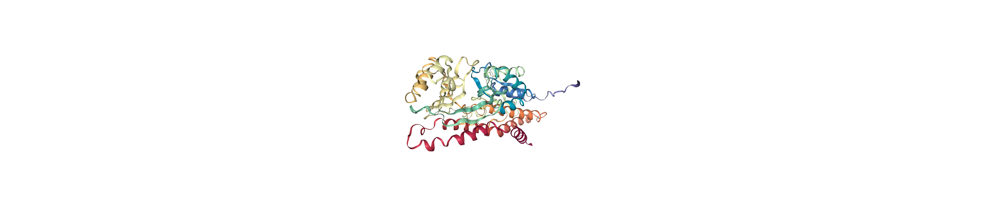

In [9]:
#View structure with cofactor
fad_view = nglview.show_file(pdb_with_fad_path)
fad_view.display()

NGLWidget()

In [16]:
fad_view.download_image(factor = 10, filename = 'fad.png')

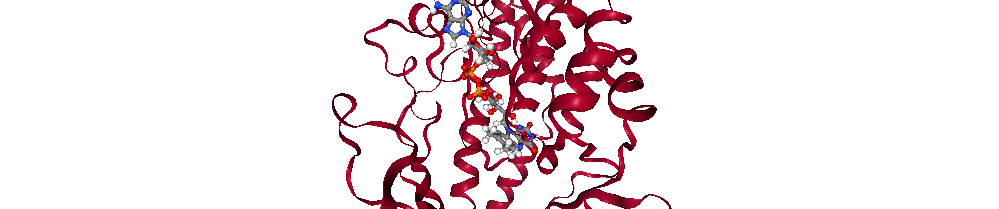

In [17]:
#View structure with docked ligand
dock_view = nglview.show_file(pdb_with_fad_path)
dock_view.add_component(top_pose_path)
dock_view.display()

NGLWidget()

In [18]:
dock_view.download_image(factor = 10, filename = 'dock.png')

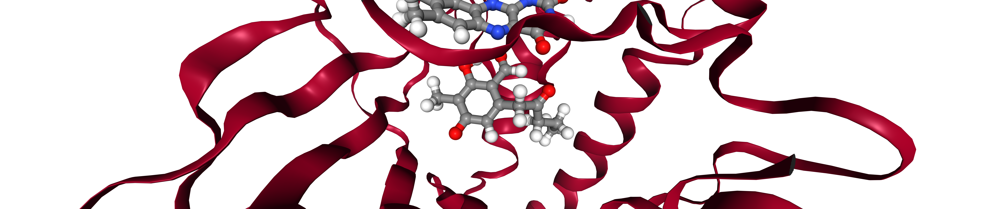

In [19]:
#Calculate metrics for top ligand pose
metric_dict = get_pose_metrics(pdb_with_fad_path, top_pose_path, ligand, lig_atom_dict, R206_resi = 206)
for k,v in metric_dict.items():
    print(k, v)

fad_coor (51.853, 45.512, 43.91)
lig_ave_coor [57.305, 47.37771428571428, 44.38014285714285]
dist_to_fadh 5.781542017666289
lig_norm (57.62986200000001, 47.88907928571429, 45.970137857142845)
fad_vector (-5.451999999999998, -1.865714285714283, -0.47014285714285364)
angle 110.67
stereo R
R206 coor (57.273, 49.985, 39.942)
lig anion coor (59.293, 47.974, 43.536)
anion dist 4.58708589411622


In [14]:
#Display how stereochemistry is calculated
stereo_view = nglview.show_file(pdb_with_fad_path)
stereo_view.add_component(top_pose_path)
stereo_view[0].clear_representations()
stereo_view[1].clear_representations()
stereo_view[0].add_representation(repr_type= 'ball+stick', selection = 'FAD and not hydrogen')
stereo_view[0].add_representation(repr_type= 'ball+stick', selection = "206 and not hydrogen")
stereo_view[1].add_representation(repr_type= 'ball+stick', selection = 'LIG and not hydrogen')
stereo_view[1].center(selection = 'LIG')

#Add arrows with nglview shape
shape = nglview.shape.Shape(view=stereo_view)
# add_arrow(position1, position2, color, radius, name)

#Add normal vector to plane of ligand
shape.add_arrow(metric_dict['lig_ave_coor'], metric_dict['lig_norm'], [1, 0, 0], '.5', 'norm')

#Add distance vector to fad
shape.add_arrow(metric_dict['lig_ave_coor'], metric_dict['fad_coor'], [0, 0, 1], '.5', 'dist')

#Label with angle (translate coordinates to move labels, adjust with different protein ligand complex)
shape.add_text([x + 3 for x in metric_dict['lig_ave_coor']], [0, 0, 0], 3, str(metric_dict['angle']) + '°')
shape.add_text([x + -.5 for x in metric_dict['lig_ave_coor']], [0, 0, 0], 3, f'Ligand {ligand}')
shape.add_text([x + 0 for x in metric_dict['fad_coor']], [0, 0, 0], 3, "FAD C13")
shape.add_text([x + -.25 for x in metric_dict['R206 coor']], [0, 0, 0], 3, "R206")


stereo_view.display()

NGLWidget()

In [21]:
stereo_view.download_image(factor = 10, filename = 'stereo.png')

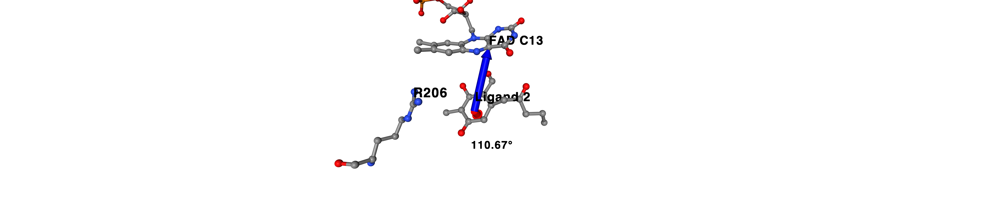